### Performing PCA with an Undercomplete Linear Autoencoder

In [6]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

In [7]:
# GPU training is unreliable on Mac
tf.config.set_visible_devices([], 'GPU')

In [8]:
encoder = tf.keras.Sequential([tf.keras.layers.Dense(2)])
decoder = tf.keras.Sequential([tf.keras.layers.Dense(3)])
autoencoder = tf.keras.Sequential([encoder, decoder])

optimizer = tf.keras.optimizers.legacy.SGD(learning_rate=0.5)
autoencoder.compile(loss="mse", optimizer=optimizer)

In [9]:
# extra code – builds the same 3D dataset as in Chapter 8

import numpy as np
from scipy.spatial.transform import Rotation

m = 60
X = np.zeros((m, 3))  # initialize 3D dataset
np.random.seed(42)
angles = (np.random.rand(m) ** 3 + 0.5) * 2 * np.pi  # uneven distribution
X[:, 0], X[:, 1] = np.cos(angles), np.sin(angles) * 0.5  # oval
X += 0.28 * np.random.randn(m, 3)  # add more noise
X = Rotation.from_rotvec([np.pi / 29, -np.pi / 20, np.pi / 4]).apply(X)
X_train = X + [0.2, 0, 0.2]  # shift a bit

In [10]:
history = autoencoder.fit(X_train, X_train, epochs=500, verbose=False)
codings = encoder.predict(X_train)

2/2 [==============================] - 0s 918us/step


In [11]:
codings.shape

(60, 2)

**Implementing a Stacked Autoencoder Using Keras**

In [12]:
# extra code – loads, scales, and splits the fashion MNIST dataset
fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

In [13]:
stacked_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(30, activation="relu"),
])
stacked_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28])
])
stacked_ae = tf.keras.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="mse", optimizer="nadam")
history = stacked_ae.fit(X_train, X_train, epochs=20,
                        validation_data=(X_valid, X_valid))

Epoch 1/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0247 - val_loss: 0.0187
Epoch 2/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0176 - val_loss: 0.0171
Epoch 3/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0161 - val_loss: 0.0157
Epoch 4/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0153 - val_loss: 0.0150
Epoch 5/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0147 - val_loss: 0.0147
Epoch 6/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0144 - val_loss: 0.0143
Epoch 7/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0141 - val_loss: 0.0141
Epoch 8/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0139 - val_loss: 0.0140
Epoch 9/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0138 - val_loss: 0.0139
Epoch 10/20
1719/1719 [==============================] - 3s 2ms/step - loss: 0.013

**Visualizing the Reconstrunctions**

1/1 [==============================] - 0s 27ms/step


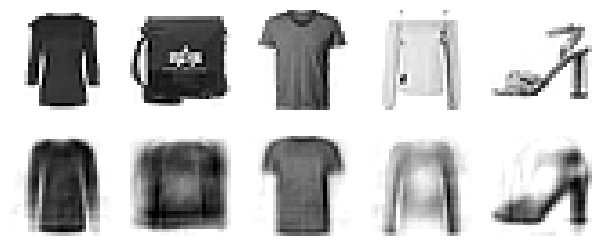

In [14]:
def plot_reconstructions(model, images=X_valid, n_images=5):
    reconstrunctions = np.clip(model.predict(images[:n_images]), 0, 1)
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plt.imshow(images[image_index], cmap="binary")
        plt.axis("off")
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plt.imshow(reconstrunctions[image_index], cmap="binary")
        plt.axis("off")

plot_reconstructions(stacked_ae)

**Visualizing the Fashion MNIST Dataset**

In [15]:
# First use the encoder to reduce dimensionality to 30, then use t-SNE
from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE(init="pca", learning_rate="auto", random_state=42)
X_valid_2D = tsne.fit_transform(X_valid_compressed)

157/157 [==============================] - 0s 336us/step


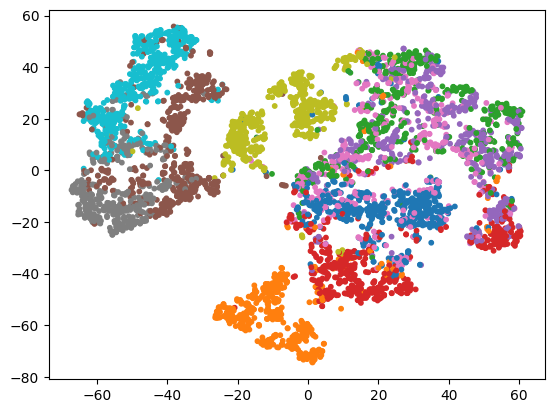

In [16]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")


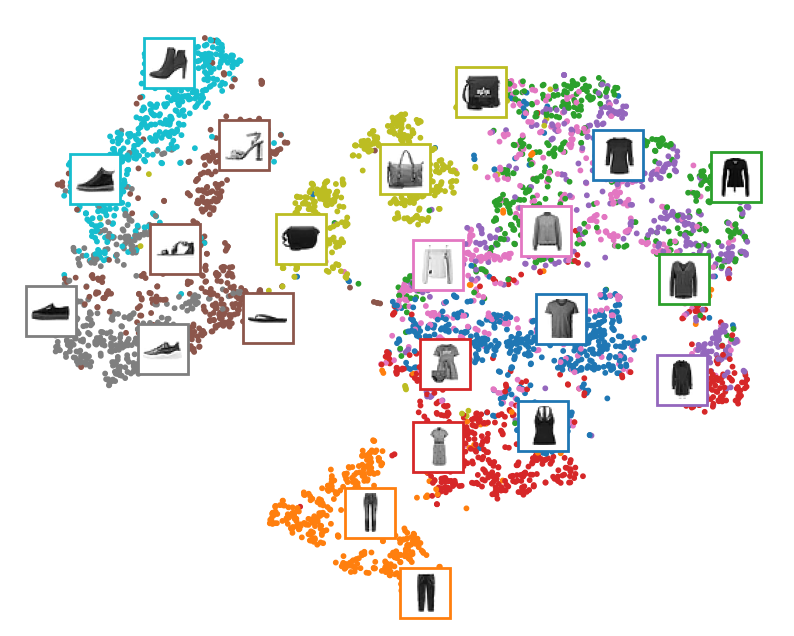

In [17]:
# extra code – beautifies the previous diagram for the book

import matplotlib as mpl

plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
Z = X_valid_2D
Z = (Z - Z.min()) / (Z.max() - Z.min())  # normalize to the 0-1 range
plt.scatter(Z[:, 0], Z[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(Z):
    dist = ((position - image_positions) ** 2).sum(axis=1)
    if dist.min() > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)

plt.axis("off")
# save_fig("fashion_mnist_visualization_plot")
plt.show()

**Tying Weights**

In [18]:
class DenseTranspose(tf.keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.dense = dense
        self.activation = tf.keras.activations.get(activation)

    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias",
                                      shape=self.dense.input_shape[-1],
                                      initializer="zeros")
        super().build(batch_input_shape)

    def call(self, inputs):
        Z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(Z + self.biases)

In [19]:
dense_1 = tf.keras.layers.Dense(100, activation="relu")
dense_2 = tf.keras.layers.Dense(30, activation="relu")

tied_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    dense_1,
    dense_2
])

tied_decoder = tf.keras.Sequential([
    DenseTranspose(dense_2, activation="relu"),
    DenseTranspose(dense_1),
    tf.keras.layers.Reshape([28, 28])
])

tied_ae = tf.keras.Sequential([tied_encoder, tied_decoder])

# extra code – compiles and fits the model
tied_ae.compile(loss="mse", optimizer="nadam")
history = tied_ae.fit(X_train, X_train, epochs=10,
                    validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 3s 1ms/step - loss: 0.0245 - val_loss: 0.0176
Epoch 2/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0167 - val_loss: 0.0156
Epoch 3/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0153 - val_loss: 0.0147
Epoch 4/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0147 - val_loss: 0.0145
Epoch 5/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0143 - val_loss: 0.0141
Epoch 6/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0140 - val_loss: 0.0140
Epoch 7/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0138 - val_loss: 0.0137
Epoch 8/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0136 - val_loss: 0.0136
Epoch 9/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0134 - val_loss: 0.0135
Epoch 10/10
1719/1719 [==============================] - 2s 1ms/step - loss: 0.013

### Convolutional Autoencoders

In [20]:
conv_encoder = tf.keras.Sequential([
    tf.keras.layers.Reshape([28, 28, 1]),  # add the depth dimension
    tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),  # output: 14 x 14 x 16
    tf.keras.layers.Conv2D(32, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),  # output: 7 x 7 x 32
    tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),  # output: 3 x 3 x 64
    tf.keras.layers.Conv2D(30, 3, padding="same", activation="relu"),
    tf.keras.layers.GlobalMaxPool2D()  # output: 30
])
conv_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(3 * 3 * 16),
    tf.keras.layers.Reshape((3, 3, 16)),
    tf.keras.layers.Conv2DTranspose(32, 3, strides=2, activation="relu"),  # Fig. 14-28
    tf.keras.layers.Conv2DTranspose(16, 3, strides=2, padding="same", activation="relu"),
    tf.keras.layers.Conv2DTranspose(1, 3, strides=2, padding="same"),
    tf.keras.layers.Reshape([28, 28])
])
conv_ae = tf.keras.Sequential([conv_encoder, conv_decoder])

# extra code – compiles and fits the model
conv_ae.compile(loss="mse", optimizer="nadam")
history = conv_ae.fit(X_train, X_train, epochs=10,
                    validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 13s 7ms/step - loss: 0.0302 - val_loss: 0.0203
Epoch 2/10
1719/1719 [==============================] - 15s 9ms/step - loss: 0.0188 - val_loss: 0.0174
Epoch 3/10
1719/1719 [==============================] - 18s 10ms/step - loss: 0.0160 - val_loss: 0.0149
Epoch 4/10
1719/1719 [==============================] - 18s 11ms/step - loss: 0.0144 - val_loss: 0.0137
Epoch 5/10
1719/1719 [==============================] - 18s 11ms/step - loss: 0.0134 - val_loss: 0.0134
Epoch 6/10
1719/1719 [==============================] - 18s 10ms/step - loss: 0.0127 - val_loss: 0.0123
Epoch 7/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.0121 - val_loss: 0.0119
Epoch 8/10
1719/1719 [==============================] - 18s 10ms/step - loss: 0.0117 - val_loss: 0.0115
Epoch 9/10
1719/1719 [==============================] - 18s 10ms/step - loss: 0.0114 - val_loss: 0.0113
Epoch 10/10
1719/1719 [==============================] - 18s 10ms/

In [21]:
conv_decoder.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 144)               4464      
                                                                 
 reshape_3 (Reshape)         (None, 3, 3, 16)          0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 7, 7, 32)          4640      
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 14, 14, 16)        4624      
 Transpose)                                                      
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 28, 28, 1)         145       
 Transpose)                                                      
                                                     

### Denoising Autoencoders

In [22]:
dropout_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(30, activation="relu"),
])
dropout_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28])
])
dropout_ae = tf.keras.Sequential([dropout_encoder, dropout_decoder])

# extra code – compiles and fits the model
dropout_ae.compile(loss="mse", optimizer="nadam")
history = dropout_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0286 - val_loss: 0.0212
Epoch 2/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0216 - val_loss: 0.0192
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0203 - val_loss: 0.0183
Epoch 4/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0195 - val_loss: 0.0176
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0190 - val_loss: 0.0174
Epoch 6/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0187 - val_loss: 0.0169
Epoch 7/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0185 - val_loss: 0.0168
Epoch 8/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0183 - val_loss: 0.0164
Epoch 9/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0181 - val_loss: 0.0163
Epoch 10/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.018

1/1 [==============================] - 0s 28ms/step


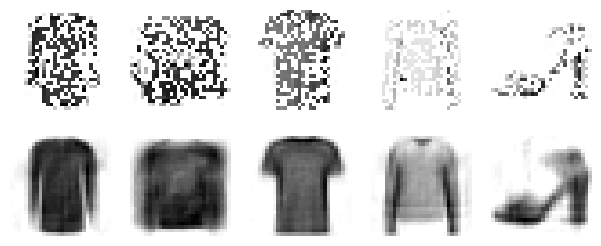

In [23]:
# extra code – this cell generates and saves Figure 17–9
tf.random.set_seed(42)
dropout = tf.keras.layers.Dropout(0.5)
plot_reconstructions(dropout_ae, dropout(X_valid, training=True))
# save_fig("dropout_denoising_plot")
plt.show()

### Sparse Autoencoders

In [24]:
sparse_l1_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(300, activation="sigmoid"),  # values between 0 and 1
    tf.keras.layers.ActivityRegularization(l1=1e-4)
])
sparse_l1_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28])
])
sparse_l1_ae = tf.keras.Sequential([sparse_l1_encoder, sparse_l1_decoder])

sparse_l1_ae.compile(loss="mse", optimizer="nadam")
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.0300 - val_loss: 0.0212
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0185 - val_loss: 0.0169
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0159 - val_loss: 0.0158
Epoch 4/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0144 - val_loss: 0.0139
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0135 - val_loss: 0.0133
Epoch 6/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0128 - val_loss: 0.0125
Epoch 7/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0123 - val_loss: 0.0122
Epoch 8/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 9/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0115 - val_loss: 0.0116
Epoch 10/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.011

In [25]:
# Sparsed Autoencoder based on KL Divergence
kl_divergence = tf.keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, weight, target):
        self.weight = weight
        self.target = target

    def __call__(self, inputs):
        mean_activities = tf.reduce_mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) + 
            kl_divergence(1. - self.target, 1. - mean_activities)
        )

In [26]:
# Probably there's broadcasting taking place
kl_divergence(0.1, [0.5, 0.6])

<tf.Tensor: shape=(), dtype=float32, numpy=-0.34011975>

In [27]:
kld_reg = KLDivergenceRegularizer(weight=5e-3, target=0.1)
sparse_kl_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(300, activation="sigmoid",
                            activity_regularizer=kld_reg)
])
sparse_kl_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28])
])
sparse_kl_ae = tf.keras.Sequential([sparse_kl_encoder, sparse_kl_decoder])

# extra code – compiles and fits the model
sparse_kl_ae.compile(loss="mse", optimizer="nadam")
history = sparse_kl_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.0274 - val_loss: 0.0188
Epoch 2/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.0168 - val_loss: 0.0158
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0142 - val_loss: 0.0138
Epoch 4/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.0126 - val_loss: 0.0126
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0117 - val_loss: 0.0114
Epoch 6/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.0111 - val_loss: 0.0107
Epoch 7/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0106 - val_loss: 0.0104
Epoch 8/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.0103 - val_loss: 0.0104
Epoch 9/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.0101 - val_loss: 0.0104
Epoch 10/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.010

1/1 [==============================] - 0s 34ms/step


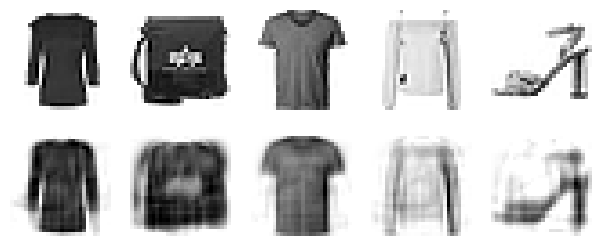

In [28]:
tf.random.set_seed(42)
plot_reconstructions(sparse_kl_ae, X_valid)

### Variational Autoencoders

In [29]:
class Sampling(tf.keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return tf.random.normal(tf.shape(log_var)) * tf.exp(log_var / 2) + mean

In [71]:
codings_size = 10

inputs = tf.keras.layers.Input(shape=[28, 28])
Z = tf.keras.layers.Flatten()(inputs)
Z = tf.keras.layers.Dense(150, activation="relu")(Z)
Z = tf.keras.layers.Dense(100, activation="relu")(Z)
codings_mean = tf.keras.layers.Dense(codings_size)(Z)  # μ
codings_log_var = tf.keras.layers.Dense(codings_size)(Z) # γ
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = tf.keras.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings]
)

In [72]:
decoder_inputs = tf.keras.layers.Input(shape=[codings_size])
x = tf.keras.layers.Dense(100, activation="relu")(decoder_inputs)
x = tf.keras.layers.Dense(150, activation="relu")(x)
x = tf.keras.layers.Dense(28 * 28)(x)
outputs = tf.keras.layers.Reshape([28, 28])(x)
variational_decoder = tf.keras.Model(inputs=[decoder_inputs], outputs=[outputs])

In [73]:
_, _, codings = variational_encoder(inputs)
reconstrunctions = variational_decoder(codings)
variational_ae = tf.keras.Model(inputs=[inputs], outputs=[reconstrunctions])

In [74]:
variational_ae.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28)]          0         
                                                                 
 model_3 (Functional)        [(None, 10),              134870    
                              (None, 10),                        
                              (None, 10)]                        
                                                                 
 model_4 (Functional)        (None, 28, 28)            134634    
                                                                 
Total params: 269504 (1.03 MB)
Trainable params: 269504 (1.03 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


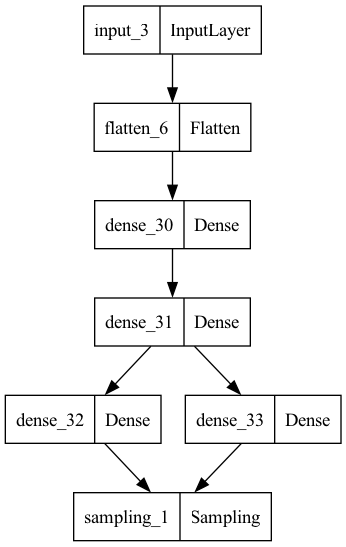

In [75]:
tf.keras.utils.plot_model(variational_encoder)

In [76]:
variational_encoder.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 28, 28)]             0         []                            
                                                                                                  
 flatten_6 (Flatten)         (None, 784)                  0         ['input_3[0][0]']             
                                                                                                  
 dense_30 (Dense)            (None, 150)                  117750    ['flatten_6[0][0]']           
                                                                                                  
 dense_31 (Dense)            (None, 100)                  15100     ['dense_30[0][0]']            
                                                                                            

In [77]:
latent_loss = -0.5 * tf.reduce_sum(
    1 + codings_log_var - tf.exp(codings_log_var) - tf.square(codings_mean),
    axis=-1
)
variational_ae.add_loss(tf.reduce_mean(latent_loss) / 784.)

In [78]:
variational_ae.compile(loss="mse", optimizer="nadam")
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                                validation_data=(X_valid, X_valid))

Epoch 1/25
430/430 [==============================] - 3s 5ms/step - loss: 0.0526 - val_loss: 0.0401
Epoch 2/25
430/430 [==============================] - 2s 6ms/step - loss: 0.0377 - val_loss: 0.0363
Epoch 3/25
430/430 [==============================] - 2s 6ms/step - loss: 0.0358 - val_loss: 0.0356
Epoch 4/25
430/430 [==============================] - 2s 6ms/step - loss: 0.0343 - val_loss: 0.0341
Epoch 5/25
430/430 [==============================] - 3s 6ms/step - loss: 0.0337 - val_loss: 0.0337
Epoch 6/25
430/430 [==============================] - 2s 6ms/step - loss: 0.0333 - val_loss: 0.0332
Epoch 7/25
430/430 [==============================] - 3s 6ms/step - loss: 0.0329 - val_loss: 0.0331
Epoch 8/25
430/430 [==============================] - 2s 6ms/step - loss: 0.0326 - val_loss: 0.0327
Epoch 9/25
430/430 [==============================] - 3s 6ms/step - loss: 0.0324 - val_loss: 0.0328
Epoch 10/25
430/430 [==============================] - 2s 6ms/step - loss: 0.0322 - val_loss: 0.0324

1/1 [==============================] - 0s 55ms/step


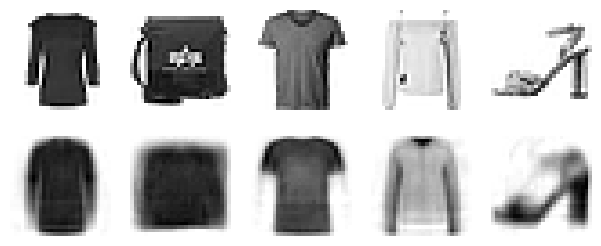

In [79]:
plot_reconstructions(variational_ae)

### Generating Fashion MNIST Images

In [80]:
# Why produce codings with zero mean and std=1 ???
codings = tf.random.normal(shape=[3 * 7, codings_size])
images = variational_decoder(codings).numpy()

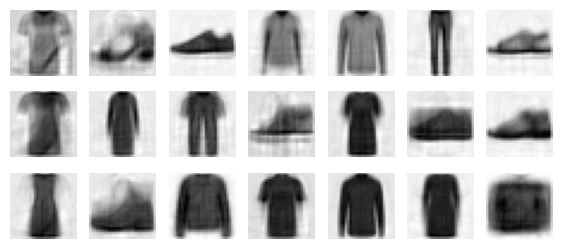

In [81]:
# extra code – this cells generates and saves Figure 17-12

def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

plot_multiple_images(images, 7)
# save_fig("vae_generated_images_plot", tight_layout=False)
plt.show()

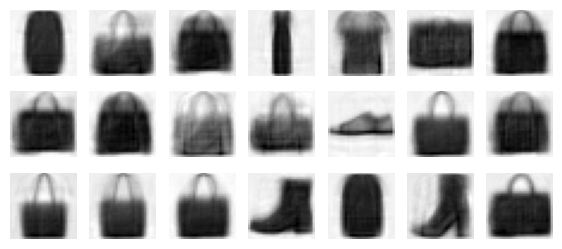

In [82]:
# The mean and the std can be anything we want
codings = tf.random.normal(shape=[3 * 7, codings_size], mean=1, stddev=1)
images = variational_decoder(codings).numpy()

plot_multiple_images(images, 7)

In [83]:
tf.random.set_seed(42)
codings = np.zeros([7, codings_size])
codings[:, 3] = np.linspace(-0.8, 0.8, 7)  # axis 3 looks best in this case
images = variational_decoder(codings).numpy()

In [84]:
codings

array([[ 0.        ,  0.        ,  0.        , -0.8       ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , -0.53333333,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , -0.26666667,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.26666667,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.53333333,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.8       ,  0.        ,
         0.        ,  0.        ,  0.        

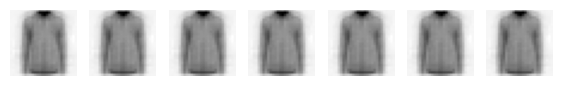

In [85]:
# extra code – this cell generates and saves Figure 17–13
plot_multiple_images(images)
# save_fig("semantic_interpolation_plot", tight_layout=False)
plt.show()

In [63]:
codings_mean_out, codings_log_var_out, codings_out = variational_encoder(X_valid)

In [53]:
codings_mean_out

<tf.Tensor: shape=(5000, 10), dtype=float32, numpy=
array([[-0.44588223,  0.11851011, -0.0095665 , ...,  1.6305375 ,
        -0.00780373,  0.00960029],
       [ 1.4571091 , -0.09737605, -0.00212779, ...,  1.3176947 ,
        -0.04369923,  0.01615207],
       [ 0.02524894,  0.6901932 , -0.00614137, ...,  0.8615076 ,
        -0.0297146 ,  0.02418529],
       ...,
       [-1.9420134 , -1.4676156 , -0.00569645, ...,  0.09987235,
        -0.02277924, -0.01492457],
       [ 0.04739011, -0.17208152, -0.01632396, ..., -0.02004844,
        -0.00706262,  0.00659392],
       [ 0.20559451,  0.41261494,  0.03017789, ..., -0.58629125,
        -0.00693894,  0.03713979]], dtype=float32)>

In [47]:
print(tf.reduce_mean(codings_mean_out, axis=0))

tf.Tensor(
[ 0.02273373 -0.05655084 -0.00299586 -0.0011378  -0.0080072  -0.01873367
 -0.0051972   0.0419386  -0.00416947 -0.00031952], shape=(10,), dtype=float32)


In [48]:
codings_log_var_out

<tf.Tensor: shape=(5000, 10), dtype=float32, numpy=
array([[-3.6063261e+00, -1.4019191e+00,  9.3211960e-03, ...,
        -4.2991018e+00, -5.4979362e-03, -2.9418021e-02],
       [-5.0442305e+00, -1.5567018e+00,  5.7406258e-03, ...,
        -5.2010860e+00, -7.7091521e-03, -1.8220190e-03],
       [-4.1949687e+00, -1.0044268e+00,  9.7261649e-03, ...,
        -4.7913432e+00, -1.1782646e-03, -2.5787927e-02],
       ...,
       [-3.7382600e+00, -1.3494862e+00, -2.2466481e-02, ...,
        -4.1171703e+00,  5.0581191e-03, -2.9409017e-02],
       [-4.4575634e+00, -7.4038523e-01, -3.5959985e-03, ...,
        -4.7112327e+00, -9.6858842e-03, -1.6684920e-02],
       [-4.8769259e+00, -2.9324803e-01, -1.6677469e-02, ...,
        -4.3795648e+00, -5.1130001e-03, -6.2141540e-03]], dtype=float32)>

In [49]:
codings_out

<tf.Tensor: shape=(5000, 10), dtype=float32, numpy=
array([[-0.391923  , -0.2995242 ,  0.3113594 , ...,  1.693433  ,
         1.6869633 ,  0.29431796],
       [ 1.3361439 , -0.21884634, -0.60106856, ...,  1.0930766 ,
         0.85866225,  0.3144401 ],
       [-0.00244872,  0.22925395, -1.9070772 , ...,  0.88400704,
         0.1759017 , -0.4947042 ],
       ...,
       [-1.8718897 , -1.280872  , -0.45013815, ...,  0.0542565 ,
         0.40602288, -0.38146517],
       [-0.03931326,  0.03279305, -0.06422038, ...,  0.04468878,
        -0.7052688 , -1.3220471 ],
       [ 0.25037378,  2.1137383 , -0.28593224, ..., -0.71354663,
         0.16316329, -0.13204315]], dtype=float32)>

### Generative Adversarial Networks

In [86]:
codings_size = 30
Dense = tf.keras.layers.Dense
generator = tf.keras.Sequential([
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(28 * 28, activation="sigmoid"), # so that pixel values are in 0-1 range (?)
    tf.keras.layers.Reshape([28, 28])
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(1, activation="sigmoid")  # discriminator is a binary classifier
])
gan = tf.keras.Sequential([generator, discriminator])

In [87]:
# The discriminator and the gan model are binary classifiers.
# The generator will only be trained through the gan, so we don't need
# to compile it.
# Finally, the discriminator must not be trained when training the generator,
# so we set trainable = False before compiling the gan
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [88]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(buffer_size=1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

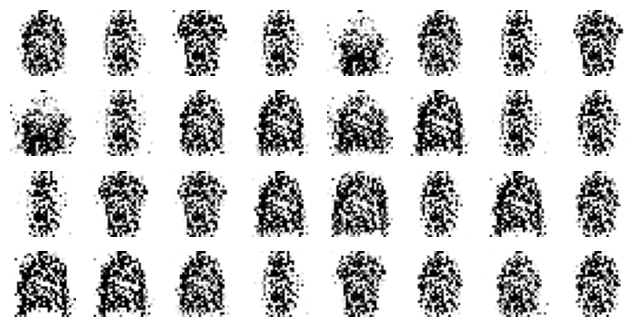

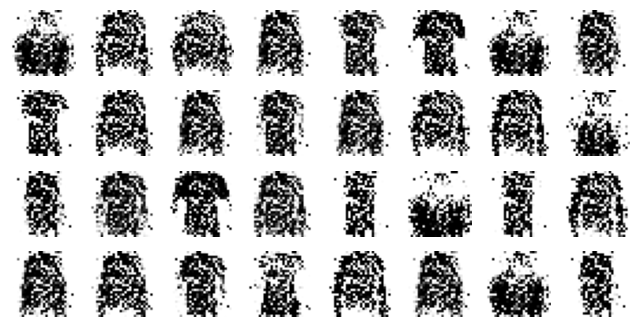

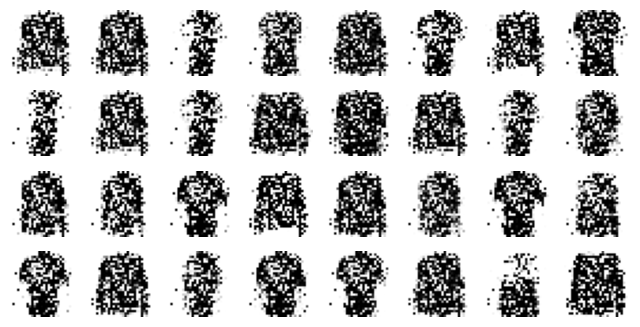

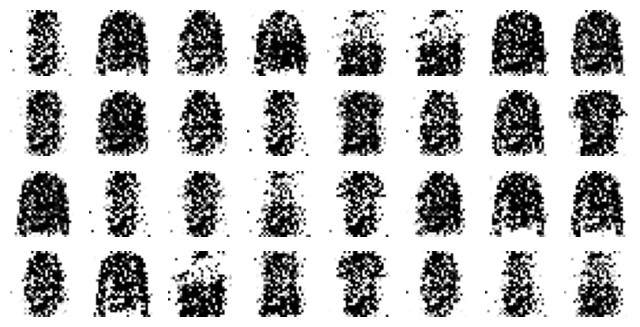

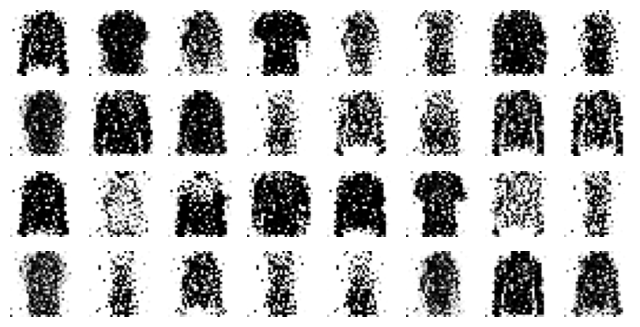

...

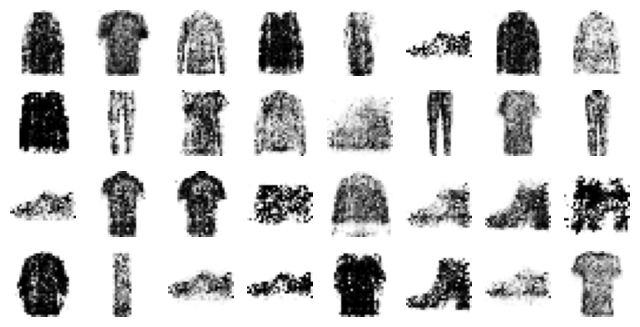

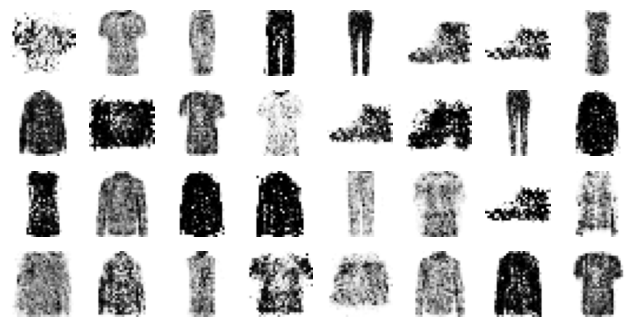

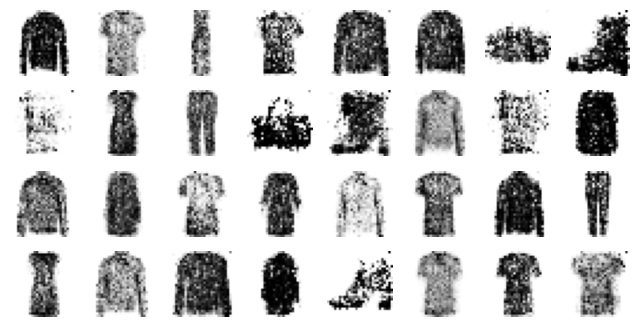

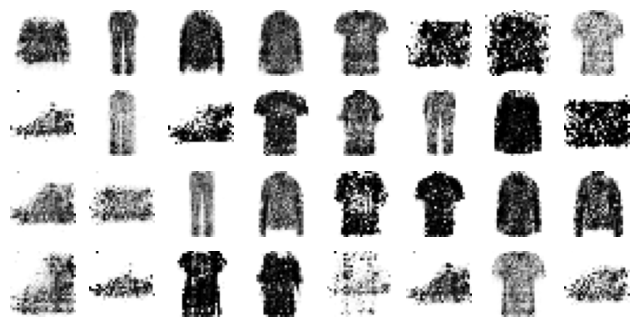

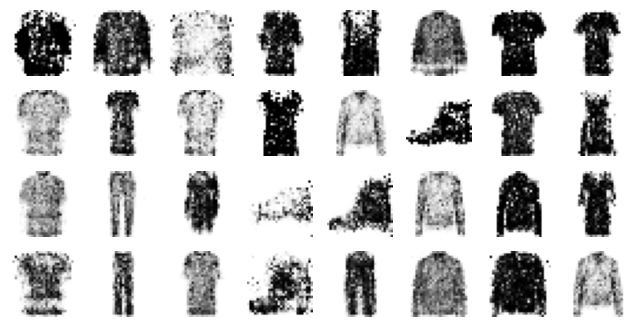

In [90]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)  # no shuffle?
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size]) # input of the generator
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)  # y2 is compared to the output of the gan
        # extra code — plot images during training
        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()

train_gan(gan, dataset, batch_size, codings_size, n_epochs=50)

In [91]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)

1/1 [==============================] - 0s 24ms/step


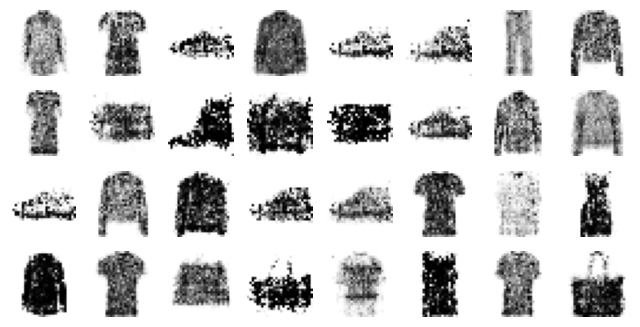

In [92]:
# extra code – this cell generates and saves Figure 17–15
plot_multiple_images(generated_images, 8)
# save_fig("gan_generated_images_plot", tight_layout=False)
plt.show()

**Deep Convolutional GANs**

In [93]:
codings_size = 100

generator = tf.keras.Sequential([
    tf.keras.layers.Dense(7 * 7 * 128),
    tf.keras.layers.Reshape([7, 7, 128]),
    tf.keras.layers.BatchNormalization(),
    # Conv2DTranspose upsamples its input
    tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2,
                                    padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2,
                                    padding="same", activation="tanh")
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same",
                           activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same",
                           activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

In [97]:
# extra code – compiles the discrimator and the gan, as earlier
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [95]:
# Rescale so the values range from -1 to 1 because of the tanh activation function
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

In [96]:
X_train.min(), X_train.max()

(0.0, 1.0)

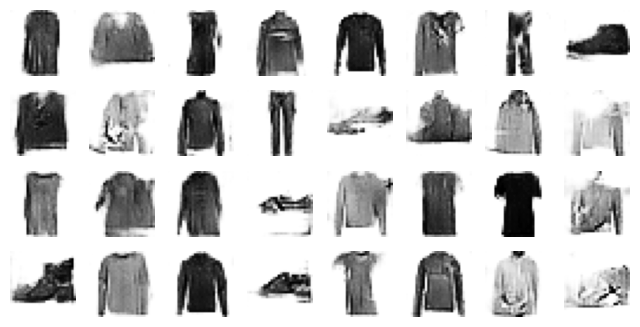

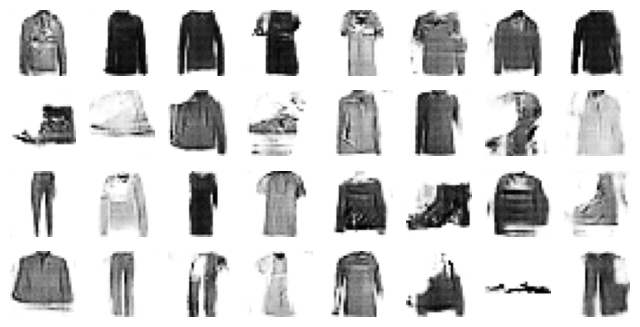

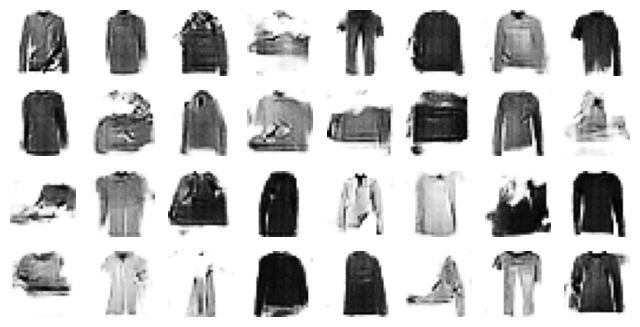

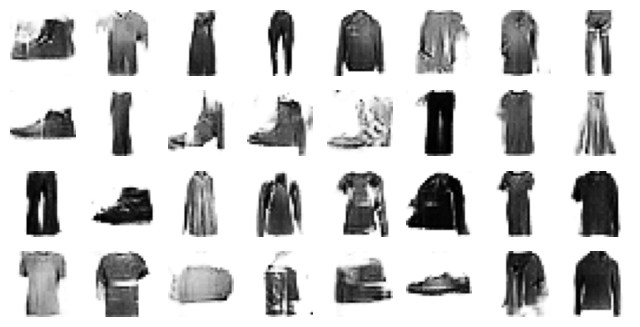

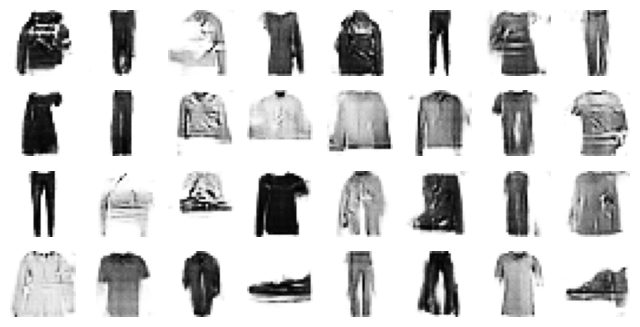

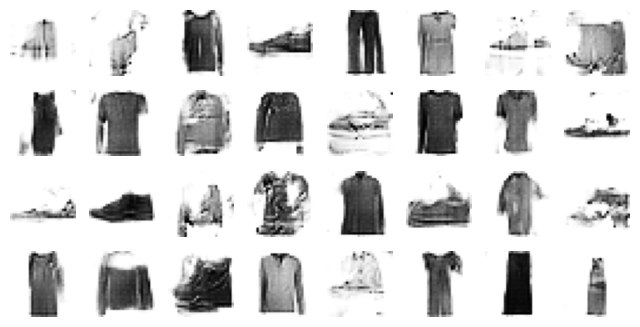

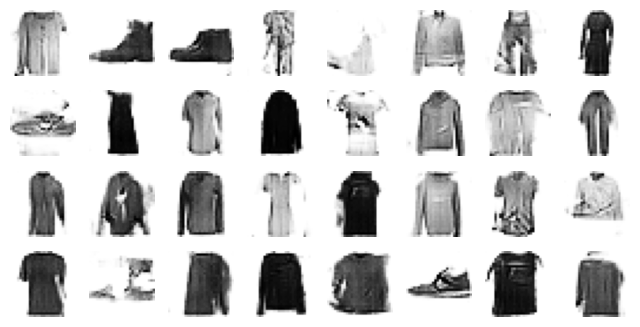

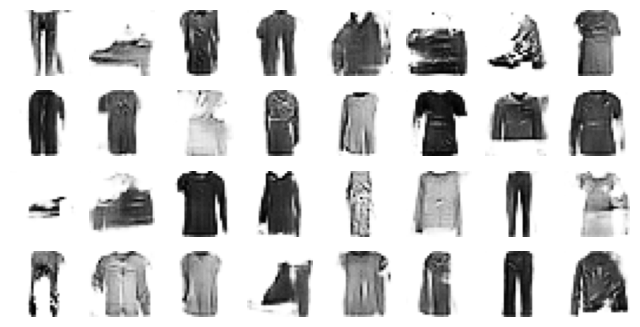

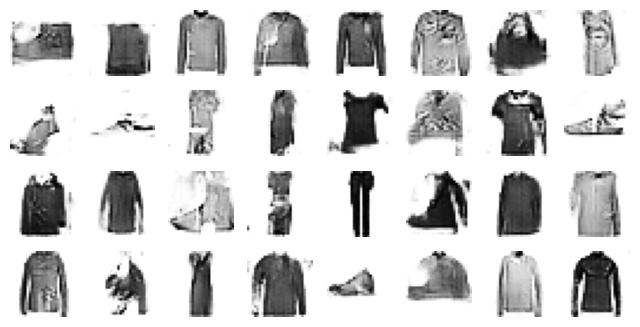

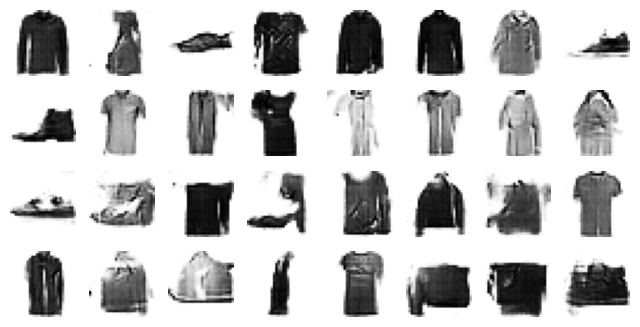

In [99]:
# extra code – generates the dataset and trains the GAN, just like earlier
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)
train_gan(gan, dataset, batch_size, codings_size, n_epochs=10)

### Diffusion Models

In [108]:
# Implements Equation 17-7

def variance_schedule(T, s=0.008, max_beta=0.999):
    t = np.arange(T + 1)
    f = np.cos((t / T + s) / (1 + s) * np.pi / 2) ** 2
    alpha = np.clip(f[1:] / f[:-1], 1 - max_beta, 1)
    alpha = np.append(1, alpha).astype(np.float32)  # add α₀ = 1
    beta = 1 - alpha
    alpha_cumprod = np.cumprod(alpha)
    return alpha, alpha_cumprod, beta # αₜ , α̅ₜ , βₜ for t = 0 to T

T = 4000
alpha, alpha_cumprod, beta = variance_schedule(T)

In [109]:
# Takes clean images and adds noise
def prepare_batch(X):
    X = tf.cast(X[..., tf.newaxis], tf.float32) * 2 - 1 # scale from -1 to 1
    X_shape = tf.shape(X)
    t = tf.random.uniform([X_shape[0]], minval=1, maxval=T + 1, dtype=tf.int32)
    alpha_cm = tf.gather(alpha_cumprod, t)  # like indexing for all indexes in t
    alpha_cm = tf.reshape(alpha_cm, [X_shape[0]] + [1] * (len(X_shape) - 1))  # reshape to [batch_size, 1, 1, 1]
    noise = tf.random.normal(X_shape)
    return {
        "X_noisy": alpha_cm ** 0.5 * X + (1 - alpha_cm) ** 0.5 * noise,
        "time": t,
    }, noise

The inputs are represented as a Python dict containing the noisy images and the time steps used to generate them. The targets are the Gaussian noise used to generate each image.
With this setup, the model will predict the noise that should be subtracted from the input image to get the original image.

In [111]:
def prepare_dataset(X, batch_size=32, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices(X)
    if shuffle:
        ds = ds.shuffle(buffer_size=10_000)
    return ds.batch(batch_size).map(prepare_batch).prefetch(1)

train_set = prepare_dataset(X_train, batch_size=32, shuffle=True)
valid_set = prepare_dataset(X_valid, batch_size=32)

In [113]:
for input, target in train_set.take(1):
    print(input)

{'X_noisy': <tf.Tensor: shape=(32, 28, 28, 1), dtype=float32, numpy=
array([[[[-1.79952   ],
         [-1.5767853 ],
         [-0.05253562],
         ...,
         [-0.11796725],
         [ 0.15909058],
         [ 0.31651407]],

        [[-0.47862253],
         [-0.21061164],
         [-1.27732   ],
         ...,
         [-0.30460644],
         [-0.23965499],
         [-1.0782382 ]],

        [[ 0.03942698],
         [-0.91496336],
         [ 0.16405565],
         ...,
         [-0.3447628 ],
         [-0.9929242 ],
         [ 0.8251211 ]],

        ...,

        [[-1.345717  ],
         [-0.60277045],
         [ 0.09027284],
         ...,
         [-0.8153657 ],
         [-1.6090012 ],
         [-2.1968067 ]],

        [[-0.34874898],
         [-1.1948607 ],
         [-0.5231129 ],
         ...,
         [-1.6851788 ],
         [-0.6449097 ],
         [-0.3287424 ]],

        [[-0.63310826],
         [ 0.6120096 ],
         [ 0.73343974],
         ...,
         [ 0.26923215],
       

In [114]:
print(target)

tf.Tensor(
[[[[-1.499947  ]
   [-1.2420495 ]
   [ 0.52283144]
   ...
   [ 0.4470702 ]
   [ 0.7678668 ]
   [ 0.9501425 ]]

  [[ 0.02947877]
   [ 0.33980015]
   [-0.8953081 ]
   ...
   [ 0.23096652]
   [ 0.30617177]
   [-0.66479754]]

  [[ 0.62931204]
   [-0.4757466 ]
   [ 0.77361566]
   ...
   [ 0.18447076]
   [-0.566015  ]
   [ 1.5390427 ]]

  ...

  [[-0.9745026 ]
   [-0.11426821]
   [ 0.68818486]
   ...
   [-0.36042556]
   [-1.2793514 ]
   [-1.959953  ]]

  [[ 0.17985529]
   [-0.7998309 ]
   [-0.02203522]
   ...
   [-1.3675549 ]
   [-0.16305992]
   [ 0.20302024]]

  [[-0.14939542]
   [ 1.2922875 ]
   [ 1.4328877 ]
   ...
   [ 0.8953963 ]
   [-0.5156677 ]
   [ 2.2807848 ]]]


 [[[-0.5398102 ]
   [ 0.36145473]
   [ 0.96345264]
   ...
   [ 0.35873646]
   [-0.44658452]
   [ 1.4015015 ]]

  [[ 0.5753185 ]
   [ 1.0277048 ]
   [-0.63369226]
   ...
   [-0.95928633]
   [ 0.09604795]
   [ 0.33095202]]

  [[ 1.9727721 ]
   [ 0.06825262]
   [ 2.0234296 ]
   ...
   [ 1.0676805 ]
   [-1.2917178 ]


In [115]:
# extra code – implements a custom time encoding layer

embed_size = 64

class TimeEncoding(tf.keras.layers.Layer):
    def __init__(self, T, embed_size, dtype=tf.float32, **kwargs):
        super().__init__(dtype=dtype, **kwargs)
        assert embed_size % 2 == 0, "embed_size must be even"
        p, i = np.meshgrid(np.arange(T + 1), 2 * np.arange(embed_size // 2))
        t_emb = np.empty((T + 1, embed_size))
        t_emb[:, ::2] = np.sin(p / 10_000 ** (i / embed_size)).T
        t_emb[:, 1::2] = np.cos(p / 10_000 ** (i / embed_size)).T
        self.time_encodings = tf.constant(t_emb.astype(self.dtype))

    def call(self, inputs):
        return tf.gather(self.time_encodings, inputs)

In [116]:
def build_diffusion_model():
    X_noisy = tf.keras.layers.Input(shape=[28, 28, 1], name="X_noisy")
    time_input = tf.keras.layers.Input(shape=[], dtype=tf.int32, name="time")
    time_enc = TimeEncoding(T, embed_size)(time_input)

    dim = 16
    Z = tf.keras.layers.ZeroPadding2D((3, 3))(X_noisy)
    Z = tf.keras.layers.Conv2D(dim, 3)(Z)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation("relu")(Z)

    time = tf.keras.layers.Dense(dim)(time_enc)  # adapt time encoding
    Z = time[:, tf.newaxis, tf.newaxis, :] + Z  # add time data to every pixel

    skip = Z
    cross_skips = []  # skip connections across the down & up parts of the UNet

    for dim in (32, 64, 128):
        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.SeparableConv2D(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.SeparableConv2D(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        cross_skips.append(Z)
        Z = tf.keras.layers.MaxPooling2D(3, strides=2, padding="same")(Z)
        skip_link = tf.keras.layers.Conv2D(dim, 1, strides=2,
                                           padding="same")(skip)
        Z = tf.keras.layers.add([Z, skip_link])

        time = tf.keras.layers.Dense(dim)(time_enc)
        Z = time[:, tf.newaxis, tf.newaxis, :] + Z
        skip = Z

    for dim in (64, 32, 16):
        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.Conv2DTranspose(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        Z = tf.keras.layers.Activation("relu")(Z)
        Z = tf.keras.layers.Conv2DTranspose(dim, 3, padding="same")(Z)
        Z = tf.keras.layers.BatchNormalization()(Z)

        Z = tf.keras.layers.UpSampling2D(2)(Z)

        skip_link = tf.keras.layers.UpSampling2D(2)(skip)
        skip_link = tf.keras.layers.Conv2D(dim, 1, padding="same")(skip_link)
        Z = tf.keras.layers.add([Z, skip_link])

        time = tf.keras.layers.Dense(dim)(time_enc)
        Z = time[:, tf.newaxis, tf.newaxis, :] + Z
        Z = tf.keras.layers.concatenate([Z, cross_skips.pop()], axis=-1)
        skip = Z

    outputs = tf.keras.layers.Conv2D(1, 3, padding="same")(Z)[:, 2:-2, 2:-2]
    return tf.keras.Model(inputs=[X_noisy, time_input], outputs=[outputs])

In [117]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on the CPU
model = build_diffusion_model()
model.compile(loss=tf.keras.losses.Huber(), optimizer="nadam")

# extra code – adds a ModelCheckpoint callback
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("my_diffusion_model",
                                                   save_best_only=True)

history = model.fit(train_set, validation_data=valid_set, epochs=100,
                    callbacks=[checkpoint_cb])  # extra code

Epoch 1/100
1719/1719 [==============================] - ETA: 0s - loss: 0.1026INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 59ms/step - loss: 0.1026 - val_loss: 0.0704
Epoch 2/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0636INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 105s 61ms/step - loss: 0.0636 - val_loss: 0.0580
Epoch 3/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0538INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 103s 60ms/step - loss: 0.0538 - val_loss: 0.0518
Epoch 4/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0496INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 60ms/step - loss: 0.0496 - val_loss: 0.0484
Epoch 5/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0471INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 61ms/step - loss: 0.0471 - val_loss: 0.0462
Epoch 6/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0454INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 61ms/step - loss: 0.0454 - val_loss: 0.0453
Epoch 7/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0442INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 108s 63ms/step - loss: 0.0442 - val_loss: 0.0437
Epoch 8/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0436INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0436 - val_loss: 0.0431
Epoch 9/100
1719/1719 [==============================] - 106s 62ms/step - loss: 0.0427 - val_loss: 0.0447
Epoch 10/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0424INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 108s 63ms/step - loss: 0.0424 - val_loss: 0.0423
Epoch 11/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0419INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 107s 62ms/step - loss: 0.0419 - val_loss: 0.0422
Epoch 12/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0417INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 108s 63ms/step - loss: 0.0417 - val_loss: 0.0417
Epoch 13/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0414INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 111s 65ms/step - loss: 0.0414 - val_loss: 0.0417
Epoch 14/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0411INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 108s 63ms/step - loss: 0.0411 - val_loss: 0.0410
Epoch 15/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0409INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0409 - val_loss: 0.0408
Epoch 16/100
1719/1719 [==============================] - 104s 61ms/step - loss: 0.0407 - val_loss: 0.0411
Epoch 17/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0406INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0406 - val_loss: 0.0406
Epoch 18/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0405 - val_loss: 0.0410
Epoch 19/100
1719/1719 [==============================] - 106s 62ms/step - loss: 0.0402 - val_loss: 0.0409
Epoch 20/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0401 - val_loss: 0.0410
Epoch 21/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0399INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 105s 61ms/step - loss: 0.0399 - val_loss: 0.0404
Epoch 22/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0400INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 109s 63ms/step - loss: 0.0400 - val_loss: 0.0402
Epoch 23/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0397INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0397 - val_loss: 0.0399
Epoch 24/100
1719/1719 [==============================] - 99s 58ms/step - loss: 0.0396 - val_loss: 0.0401
Epoch 25/100
1719/1719 [==============================] - 98s 57ms/step - loss: 0.0395 - val_loss: 0.0404
Epoch 26/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0396INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 60ms/step - loss: 0.0396 - val_loss: 0.0398
Epoch 27/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0394INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 102s 60ms/step - loss: 0.0394 - val_loss: 0.0394
Epoch 28/100
1719/1719 [==============================] - 101s 59ms/step - loss: 0.0395 - val_loss: 0.0398
Epoch 29/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0392INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 103s 60ms/step - loss: 0.0392 - val_loss: 0.0393
Epoch 30/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0393 - val_loss: 0.0394
Epoch 31/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0392 - val_loss: 0.0400
Epoch 32/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0392 - val_loss: 0.0400
Epoch 33/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0392 - val_loss: 0.0399
Epoch 34/100
1719/1719 [==============================] - 102s 59ms/step - loss: 0.0390 - val_loss: 0.0393
Epoch 35/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0390 - val_loss: 0.0400
Epoch 36/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0390INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0390 - val_loss: 0.0390
Epoch 37/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0388 - val_loss: 0.0390
Epoch 38/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0389 - val_loss: 0.0395
Epoch 39/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0388INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 60ms/step - loss: 0.0387 - val_loss: 0.0387
Epoch 40/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0390 - val_loss: 0.0388
Epoch 41/100
1719/1719 [==============================] - 104s 61ms/step - loss: 0.0387 - val_loss: 0.0391
Epoch 42/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0388 - val_loss: 0.0388
Epoch 43/100
1719/1719 [==============================] - 106s 62ms/step - loss: 0.0386 - val_loss: 0.0388
Epoch 44/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0386 - val_loss: 0.0388
Epoch 45/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0386 - val_loss: 0.0390
Epoch 46/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0386INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 107s 62ms/step - loss: 0.0386 - val_loss: 0.0387
Epoch 47/100
1719/1719 [==============================] - 104s 61ms/step - loss: 0.0387 - val_loss: 0.0395
Epoch 48/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0385INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 107s 62ms/step - loss: 0.0385 - val_loss: 0.0386
Epoch 49/100
1719/1719 [==============================] - 104s 61ms/step - loss: 0.0385 - val_loss: 0.0387
Epoch 50/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0383 - val_loss: 0.0388
Epoch 51/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0385 - val_loss: 0.0389
Epoch 52/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0384 - val_loss: 0.0388
Epoch 53/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0384 - val_loss: 0.0386
Epoch 54/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0385 - val_loss: 0.0390
Epoch 55/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0383 - val_loss: 0.0395
Epoch 56/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0382 - val_loss: 0.0389
Epoch 57/100
1719/1719 [==========================

INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0383 - val_loss: 0.0383
Epoch 59/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0383INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 104s 61ms/step - loss: 0.0383 - val_loss: 0.0382
Epoch 60/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0383INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 105s 61ms/step - loss: 0.0383 - val_loss: 0.0381
Epoch 61/100
1719/1719 [==============================] - 102s 60ms/step - loss: 0.0381 - val_loss: 0.0384
Epoch 62/100
1719/1719 [==============================] - 106s 62ms/step - loss: 0.0383 - val_loss: 0.0383
Epoch 63/100
1719/1719 [==============================] - 101s 59ms/step - loss: 0.0382 - val_loss: 0.0384
Epoch 64/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0383 - val_loss: 0.0382
Epoch 65/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0381 - val_loss: 0.0382
Epoch 66/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0381 - val_loss: 0.0384
Epoch 67/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0381 - val_loss: 0.0382
Epoch 68/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0382 - val_loss: 0.0389
Epoch 69/100
1719/1719 [==========================

INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 105s 61ms/step - loss: 0.0380 - val_loss: 0.0379
Epoch 75/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0381INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 108s 63ms/step - loss: 0.0381 - val_loss: 0.0379
Epoch 76/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0379 - val_loss: 0.0381
Epoch 77/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0380 - val_loss: 0.0381
Epoch 78/100
1719/1719 [==============================] - 106s 61ms/step - loss: 0.0379 - val_loss: 0.0383
Epoch 79/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0379 - val_loss: 0.0381
Epoch 80/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0380 - val_loss: 0.0382
Epoch 81/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0380 - val_loss: 0.0380
Epoch 82/100
1719/1719 [==============================] - 106s 62ms/step - loss: 0.0379 - val_loss: 0.0381
Epoch 83/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0379 - val_loss: 0.0379
Epoch 84/100
1719/1719 [==========================

INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 109s 63ms/step - loss: 0.0379 - val_loss: 0.0378
Epoch 86/100
1719/1719 [==============================] - 107s 62ms/step - loss: 0.0379 - val_loss: 0.0380
Epoch 87/100
1719/1719 [==============================] - 108s 63ms/step - loss: 0.0379 - val_loss: 0.0378
Epoch 88/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0379 - val_loss: 0.0383
Epoch 89/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0378 - val_loss: 0.0382
Epoch 90/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0378 - val_loss: 0.0380
Epoch 91/100
1718/1719 [============================>.] - ETA: 0s - loss: 0.0379INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 109s 63ms/step - loss: 0.0379 - val_loss: 0.0377
Epoch 92/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0378 - val_loss: 0.0378
Epoch 93/100
1719/1719 [==============================] - 104s 61ms/step - loss: 0.0378 - val_loss: 0.0383
Epoch 94/100
1719/1719 [==============================] - ETA: 0s - loss: 0.0378INFO:tensorflow:Assets written to: my_diffusion_model/assets


INFO:tensorflow:Assets written to: my_diffusion_model/assets


1719/1719 [==============================] - 106s 62ms/step - loss: 0.0378 - val_loss: 0.0377
Epoch 95/100
1719/1719 [==============================] - 103s 60ms/step - loss: 0.0379 - val_loss: 0.0381
Epoch 96/100
1719/1719 [==============================] - 105s 61ms/step - loss: 0.0376 - val_loss: 0.0382
Epoch 97/100
1719/1719 [==============================] - 104s 60ms/step - loss: 0.0379 - val_loss: 0.0380
Epoch 98/100
1719/1719 [==============================] - 107s 62ms/step - loss: 0.0377 - val_loss: 0.0380
Epoch 99/100
1719/1719 [==============================] - 106s 61ms/step - loss: 0.0378 - val_loss: 0.0379
Epoch 100/100
1719/1719 [==============================] - 109s 64ms/step - loss: 0.0377 - val_loss: 0.0379
